# Population Density and Proportion of Hong Kong by District

In [1]:
# Load important packages
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from geopandas import GeoDataFrame, points_from_xy
import folium

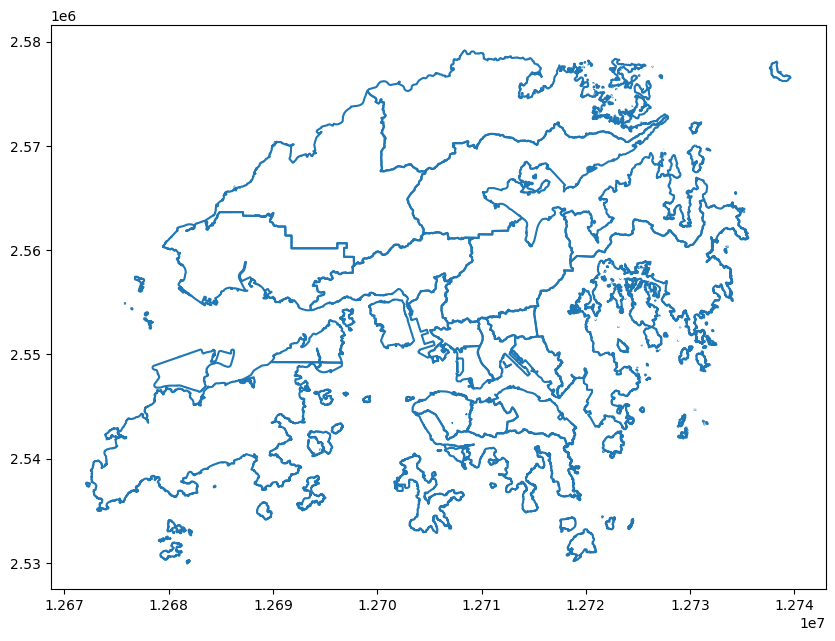

In [2]:
# Load the Hong Kong map data
hong_kong = GeoDataFrame.from_file('sources/Hong_Kong_18_Districts.geojson')

# Plot the map
fig, ax = plt.subplots(figsize=(10, 10))
hong_kong.boundary.plot(ax=ax)
plt.show()

In [3]:
hong_kong.shape

(18, 6)

In [4]:
hong_kong.head()

,OBJECTID,ID,CNAME,CNAME_S,ENAME,geometry
0,1,1,黃大仙區,黄大仙区,WONG TAI SIN,"POLYGON ((12710395.209 2553484.985, 12710398.8..."
1,2,6,九龍城區,九龙城区,KOWLOON CITY,"MULTIPOLYGON (((12710125.587 2553483.672, 1271..."
2,3,7,觀塘區,观塘区,KWUN TONG,"POLYGON ((12717551.931 2545921.534, 12717550.3..."
3,4,8,西貢區,西贡区,SAI KUNG,"MULTIPOLYGON (((12715036.831 2553981.962, 1271..."
4,5,11,北區,北区,NORTH,"MULTIPOLYGON (((12727798.495 2572871.264, 1272..."


In [5]:
hong_kong['ENAME'].unique()

array(['WONG TAI SIN', 'KOWLOON CITY', 'KWUN TONG', 'SAI KUNG', 'NORTH',
       'CENTRAL & WESTERN', 'WAN CHAI', 'EASTERN', 'TUEN MUN',
       'YUEN LONG', 'SOUTHERN', 'ISLANDS', 'SHAM SHUI PO',
       'YAU TSIM MONG', 'KWAI TSING', 'TSUEN WAN', 'TAI PO', 'SHA TIN'],
      dtype=object)

In [6]:
# interactive map with Constituency Area labels (ENAME column) using explore attribute
hong_kong.explore(column='ENAME', color='lightblue', edgecolor='black')

In [7]:
df = pd.read_csv('sources/population by district.csv')

In [8]:
df.shape

(18, 2)

In [9]:
df.head()

,District,Number of Persons
0,Central and Western,235 953
1,Wan Chai,166 695
2,Eastern,529 603
3,Southern,263 278
4,Yau Tsim Mong,310 647


In [10]:
# Capitalize the District column to match the ENAME column in the Hong Kong map data
df['District'] = df['District'].str.upper()

In [11]:
df['District'].unique()

array(['CENTRAL AND WESTERN', 'WAN CHAI', 'EASTERN', 'SOUTHERN',
       'YAU TSIM MONG', 'SHAM SHUI PO', 'KOWLOON CITY', 'WONG TAI SIN',
       'KWUN TONG', 'KWAI TSING', 'TSUEN WAN', 'TUEN MUN', 'YUEN LONG',
       'NORTH', 'TAI PO', 'SHA TIN', 'SAI KUNG', 'ISLANDS'], dtype=object)

In [12]:
# add a new column to the Hong Kong map (population data)
hong_kong = hong_kong.merge(df, left_on='ENAME', right_on='District')

In [13]:
# remove the duplicated column
hong_kong.drop(columns='District', inplace=True)
hong_kong

,OBJECTID,ID,CNAME,CNAME_S,ENAME,geometry,Number of Persons
0,1,1,黃大仙區,黄大仙区,WONG TAI SIN,"POLYGON ((12710395.209 2553484.985, 12710398.8...",406 802
1,2,6,九龍城區,九龙城区,KOWLOON CITY,"MULTIPOLYGON (((12710125.587 2553483.672, 1271...",410 634
2,3,7,觀塘區,观塘区,KWUN TONG,"POLYGON ((12717551.931 2545921.534, 12717550.3...",673 166
3,4,8,西貢區,西贡区,SAI KUNG,"MULTIPOLYGON (((12715036.831 2553981.962, 1271...",489 037
4,5,11,北區,北区,NORTH,"MULTIPOLYGON (((12727798.495 2572871.264, 1272...",309 631
5,7,14,灣仔區,湾仔区,WAN CHAI,"MULTIPOLYGON (((12712698.677 2544438.897, 1271...",166 695
6,8,15,東區,东区,EASTERN,"POLYGON ((12717960.282 2541975.218, 12717954.1...",529 603
7,9,17,屯門區,屯门区,TUEN MUN,"MULTIPOLYGON (((12683458.977 2562794.660, 1268...",506 879
8,10,18,元朗區,元朗区,YUEN LONG,"MULTIPOLYGON (((12683555.845 2562864.921, 1268...",668 080
9,11,16,南區,南区,SOUTHERN,"MULTIPOLYGON (((12703531.576 2544435.036, 1270...",263 278


In [14]:
# remove the space in the number
hong_kong['Number of Persons'] = pd.to_numeric(hong_kong['Number of Persons'].str.replace(' ', ''))


In [15]:
# Get the population density
hong_kong['population_density'] = hong_kong['Number of Persons'] / hong_kong.geometry.area

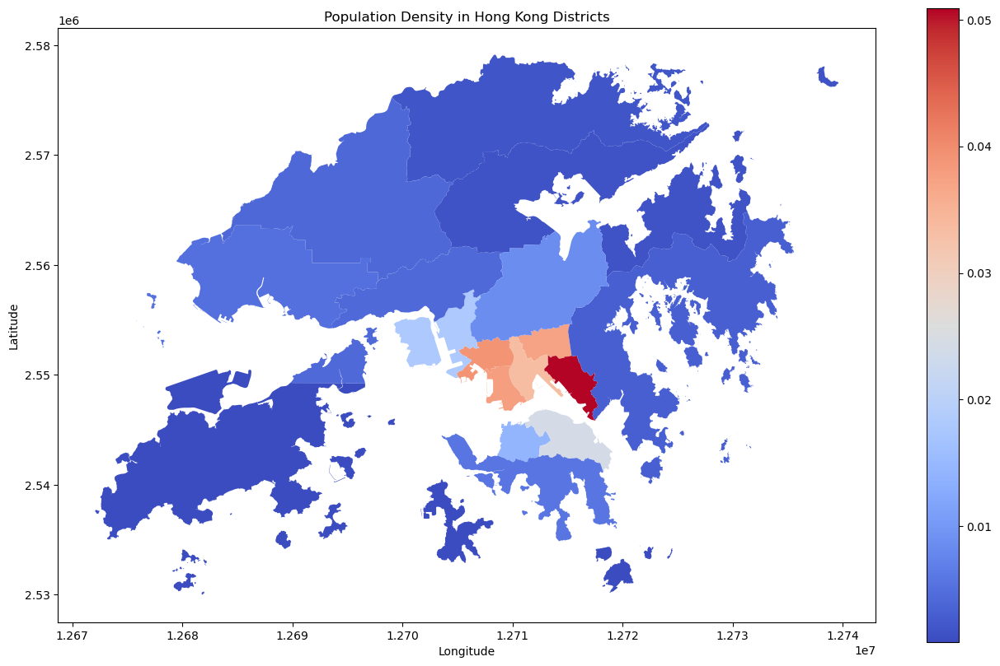

In [16]:
# Plot the Choropleth Map
fig, ax = plt.subplots(1, 1, figsize=(16, 10))
hong_kong.plot(column='population_density', ax=ax, legend=True, cmap='coolwarm')

# Set the title and labels
ax.set_title('Population Density in Hong Kong Districts')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

In [17]:
# interactive map to show the population density using explore attribute
hong_kong.explore(column='population_density', cmap='coolwarm')


In [18]:
total_population = hong_kong['Number of Persons'].sum()

# Calculate population proportion
hong_kong['population_proportion'] = hong_kong['Number of Persons'] / total_population

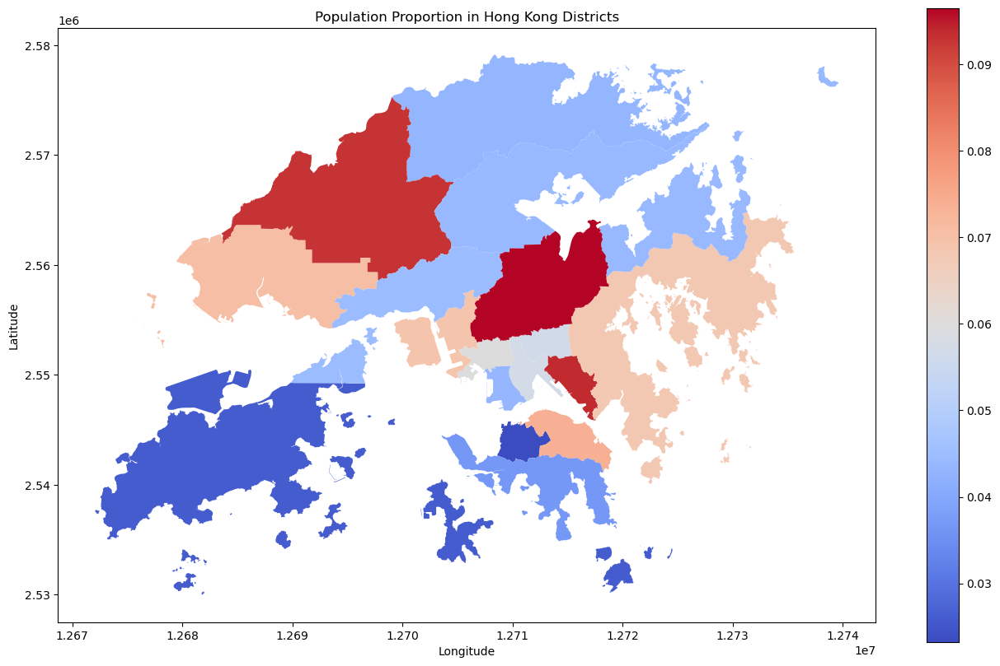

In [19]:
# Plot the Choropleth Map
fig, ax = plt.subplots(1, 1, figsize=(16, 10))
hong_kong.plot(column='population_proportion', ax=ax, legend=True, cmap='coolwarm')

# Set the title and labels
ax.set_title('Population Proportion in Hong Kong Districts')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

In [20]:
# interactive map to show the population proportion
hong_kong.explore(column='population_proportion', cmap='coolwarm')

In [21]:
hong_kong

,OBJECTID,ID,CNAME,CNAME_S,ENAME,geometry,Number of Persons,population_density,population_proportion
0,1,1,黃大仙區,黄大仙区,WONG TAI SIN,"POLYGON ((12710395.209 2553484.985, 12710398.8...",406802,0.037226,0.056689
1,2,6,九龍城區,九龙城区,KOWLOON CITY,"MULTIPOLYGON (((12710125.587 2553483.672, 1271...",410634,0.033418,0.057223
2,3,7,觀塘區,观塘区,KWUN TONG,"POLYGON ((12717551.931 2545921.534, 12717550.3...",673166,0.050915,0.093808
3,4,8,西貢區,西贡区,SAI KUNG,"MULTIPOLYGON (((12715036.831 2553981.962, 1271...",489037,0.003051,0.068149
4,5,11,北區,北区,NORTH,"MULTIPOLYGON (((12727798.495 2572871.264, 1272...",309631,0.001912,0.043148
5,7,14,灣仔區,湾仔区,WAN CHAI,"MULTIPOLYGON (((12712698.677 2544438.897, 1271...",166695,0.014352,0.023230
6,8,15,東區,东区,EASTERN,"POLYGON ((12717960.282 2541975.218, 12717954.1...",529603,0.024247,0.073802
7,9,17,屯門區,屯门区,TUEN MUN,"MULTIPOLYGON (((12683458.977 2562794.660, 1268...",506879,0.005109,0.070635
8,10,18,元朗區,元朗区,YUEN LONG,"MULTIPOLYGON (((12683555.845 2562864.921, 1268...",668080,0.004052,0.093099
9,11,16,南區,南区,SOUTHERN,"MULTIPOLYGON (((12703531.576 2544435.036, 1270...",263278,0.005668,0.036689
